In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats 
from sklearn.preprocessing import LabelEncoder 
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
import statsmodels.api as sm
from sklearn.metrics import r2_score

In [21]:
data = pd.read_csv('fifa21_male2.csv')
pd.set_option('display.max_columns',None)

/var/folders/0m/d3zbckcj1zd772z7m1w0_xgc0000gn/T/ipykernel_57476/3105375986.py:1: DtypeWarning: Columns (78) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('fifa21_male2.csv')


In [22]:
data

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,Club Logo,Flag Photo,POT,Team & Contract,Height,Weight,foot,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Contract,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,"6'0""",181lbs,Left,0,"Jul 1, 2008",NaN,€625K,€7K,€0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,"5'10""",143lbs,Right,0,"Jul 19, 2014",NaN,€600K,€7K,€1.1M,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,"5'9""",161lbs,Right,0,"Jan 7, 2016",NaN,€1.1M,€15K,€0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,"5'11""",165lbs,Right,14,NaN,NaN,€0,€0,€0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,"5'7""",150lbs,Right,0,"Jul 16, 2018",NaN,€5.5M,€12K,€7.2M,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [23]:
data.columns = data.columns.str.lower() #format cells

In [24]:
data

,id,name,age,ova,nationality,club,bov,bp,position,player photo,club logo,flag photo,pot,team & contract,height,weight,foot,growth,joined,loan date end,value,wage,release clause,contract,attacking,crossing,finishing,heading accuracy,short passing,volleys,skill,dribbling,curve,fk accuracy,long passing,ball control,movement,acceleration,sprint speed,agility,reactions,balance,power,shot power,jumping,stamina,strength,long shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing tackle,sliding tackle,goalkeeping,gk diving,gk handling,gk kicking,gk positioning,gk reflexes,total stats,base stats,w/f,sm,a/w,d/w,ir,pac,sho,pas,dri,def,phy,hits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,https://cdn.sofifa.com/teams/55/light_60.png,https://cdn.sofifa.com/flags/it.png,69,Udinese 2008 ~ 2016,"6'0""",181lbs,Left,0,"Jul 1, 2008",NaN,€625K,€7K,€0,2008 ~ 2016,313,75,50,59,71,58.0,338,73,65.0,60,69,71,347,68,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High,2 ★,71,59,70,71,68,69,4,65+0,65+0,65+0,68+0,67+0,67+0,67+0,68+0,68+0,68+0,68+0,69+0,69+0,69+0,69+0,69+0,71+-2,70+-1,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,https://cdn.sofifa.com/teams/2013/light_60.png,https://cdn.sofifa.com/flags/es.png,71,KAS Eupen 2014 ~ 2019,"5'10""",143lbs,Right,0,"Jul 19, 2014",NaN,€600K,€7K,€1.1M,2014 ~ 2019,337,68,64,61,76,68.0,369,69,79.0,79,71,71,305,56,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium,1 ★,53,69,73,69,58,63,4,67+1,67+1,67+1,67+0,68+0,68+0,68+0,67+0,70+1,70+1,70+1,68+1,70+1,70+1,70+1,68+1,62+1,66+1,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,https://cdn.sofifa.com/teams/1800/light_60.png,https://cdn.sofifa.com/flags/gb-eng.png,71,Coventry City 2016 ~ 2020,"5'9""",161lbs,Right,0,"Jan 7, 2016",NaN,€1.1M,€15K,€0,2016 ~ 2020,337,80,64,41,77,75.0,387,79,84.0,77,69,78,295,48,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low,2 ★,45,68,76,77,36,52,11,64+0,64+0,64+0,70+0,69+0,69+0,69+0,70+0,71+0,71+0,71+0,68+0,66+0,66+0,66+0,68+0,52+0,54+0,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,https://cdn.sofifa.com/teams/106/light_60.png,https://cdn.sofifa.com/flags/tt.png,82,Sunderland 2009,"5'11""",165lbs,Right,14,NaN,NaN,€0,€0,€0,2009,264,54,70,60,80,NaN,255,68,NaN,46,64,77,176,59,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN,1 ★,61,66,66,69,47,60,3,67+0,67+0,67+0,66+0,67+0,67+0,67+0,66+0,70+0,70+0,70+0,66+0,68+0,68+0,68+0,66+0,56+0,65+0,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,https://cdn.sofifa.com/teams/101146/light_60.png,https://cdn.sofifa.com/flags/es.png,81,Vissel Kobe 2018 ~ 2021,"5'7""",150lbs,Right,0,"Jul 16, 2018",NaN,€5.5M,€12K,€7.2M,2018 ~ 2021,367,75,69,54,90,79.0,408,85,80.0,70,83,90,346,61,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium,4 ★,58,70,85,85,63,59,149,72+3,72+3,72+3,79+0,79+0,79+0,79+0,79+0,82+-1,82+-1,82+-1,79+2,81+0,81+0,81+0,79+2,70+3,73+3,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [25]:
data = data.drop(['player photo','club logo','flag photo','team & contract','gender'],axis=1) #dropping columns 

In [26]:
data.shape

(17125, 102)

In [27]:
data.iloc[:, 34:67]

,sprint speed,agility,reactions,balance,power,shot power,jumping,stamina,strength,long shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing tackle,sliding tackle,goalkeeping,gk diving,gk handling,gk kicking,gk positioning,gk reflexes,total stats,base stats,w/f,sm,a/w,d/w
0,74,68.0,69,68.0,347,74,68.0,69,68,68,320,72,69.0,63.0,66.0,50,NaN,208,70,69,69.0,56,14,5,15,10,12,1929,408,3 ★,2★,Medium,High
1,50,62.0,65,72.0,324,75,54.0,64,60,71,362,71,71.0,72.0,73.0,75,79.0,153,70,43,40.0,56,9,12,13,11,11,1906,385,4 ★,3★,Medium,Medium
2,42,71.0,59,75.0,284,72,58.0,29,56,69,317,69,39.0,69.0,74.0,66,NaN,99,35,34,30.0,51,9,6,13,16,7,1770,354,4 ★,4★,Medium,Low
3,62,NaN,55,NaN,239,63,NaN,51,66,59,271,59,70.0,72.0,NaN,70,NaN,75,34,41,NaN,68,5,21,64,21,21,1348,369,3 ★,1★,NaN,NaN
4,56,79.0,75,75.0,297,67,40.0,58,62,70,370,58,70.0,78.0,93.0,71,89.0,181,68,57,56.0,45,6,13,6,13,7,2014,420,4 ★,4★,High,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17120,55,46.0,48,42.0,279,48,70.0,59,74,28,218,69,58.0,23.0,29.0,39,46.0,198,61,71,66.0,39,11,8,8,5,7,1367,302,2 ★,2★,Medium,Medium
17121,63,52.0,54,68.0,271,51,62.0,53,57,48,259,51,50.0,55.0,53.0,50,46.0,132,34,42,56.0,57,12,15,7,12,11,1529,319,3 ★,2★,Medium,Medium
17122,61,54.0,59,68.0,233,28,61.0,53,54,37,256,58,55.0,49.0,45.0,49,43.0,163,55,54,54.0,40,8,7,5,12,8,1430,303,3 ★,2★,Medium,Medium
17123,70,74.0,56,77.0,261,51,72.0,57,48,33,257,61,58.0,46.0,56.0,36,54.0,180,57,62,61.0,51,15,13,8,6,9,1579,335,4 ★,2★,High,Medium


In [28]:
data.iloc[:, 34:67].isna().sum()

sprint speed         0
agility             58
reactions            0
balance             58
power                0
shot power           0
jumping             58
stamina              0
strength             0
long shots           0
mentality            0
aggression           0
interceptions        7
positioning          7
vision              58
penalties            0
composure          423
defending            0
marking              0
standing tackle      0
sliding tackle      58
goalkeeping          0
gk diving            0
gk handling          0
gk kicking           0
gk positioning       0
gk reflexes          0
total stats          0
base stats           0
w/f                  0
sm                   0
a/w                 89
d/w                 89
dtype: int64

In [29]:
data2 = data[['id','age','ova','bov','pot','growth','value','release clause','total stats','base stats']] 
#create our testing dataframe

In [30]:
data2

,id,age,ova,bov,pot,growth,value,release clause,total stats,base stats
0,2,33,69,71,69,0,€625K,€0,1929,408
1,16,37,71,70,71,0,€600K,€1.1M,1906,385
2,27,33,71,71,71,0,€1.1M,€0,1770,354
3,36,36,68,70,82,14,€0,€0,1348,369
4,41,36,81,82,81,0,€5.5M,€7.2M,2014,420
...,...,...,...,...,...,...,...,...,...,...
17120,259088,22,64,66,69,5,€550K,€0,1367,302
17121,259090,18,56,58,66,10,€130K,€273K,1529,319
17122,259091,18,56,56,67,11,€130K,€273K,1430,303
17123,259101,20,62,62,73,11,€475K,€784K,1579,335


In [31]:
data2.isnull().sum() #checking for nulls

id                0
age               0
ova               0
bov               0
pot               0
growth            0
value             0
release clause    0
total stats       0
base stats        0
dtype: int64

In [32]:
data2.dtypes

id                 int64
age                int64
ova                int64
bov                int64
pot                int64
growth             int64
value             object
release clause    object
total stats        int64
base stats         int64
dtype: object

In [33]:
data2

,id,age,ova,bov,pot,growth,value,release clause,total stats,base stats
0,2,33,69,71,69,0,€625K,€0,1929,408
1,16,37,71,70,71,0,€600K,€1.1M,1906,385
2,27,33,71,71,71,0,€1.1M,€0,1770,354
3,36,36,68,70,82,14,€0,€0,1348,369
4,41,36,81,82,81,0,€5.5M,€7.2M,2014,420
...,...,...,...,...,...,...,...,...,...,...
17120,259088,22,64,66,69,5,€550K,€0,1367,302
17121,259090,18,56,58,66,10,€130K,€273K,1529,319
17122,259091,18,56,56,67,11,€130K,€273K,1430,303
17123,259101,20,62,62,73,11,€475K,€784K,1579,335


In [34]:
data2['value'] == 

SyntaxError: invalid syntax (1881165868.py, line 1)

In [35]:
data2['total stats'].isnull().value_counts()



False    17125
Name: total stats, dtype: int64

In [36]:
data2['total stats'].isna().value_counts()


False    17125
Name: total stats, dtype: int64

In [37]:
data2['value'] = data2['value'].astype(str).str.replace('€',"")
data2['value'] = data2['value'].astype(str).str.replace('M',"00000")
data2['value'] = data2['value'].astype(str).str.replace('K',"000")
data2['value'] = data2['value'].astype(str).str.replace('.',"")
data2['release clause'] = data2['release clause'].astype(str).str.replace('€',"")
data2['release clause'] = data2['release clause'].astype(str).str.replace('M',"00000")
data2['release clause'] = data2['release clause'].astype(str).str.replace('K',"000")
data2['release clause'] = data2['release clause'].astype(str).str.replace('.',"")

/var/folders/0m/d3zbckcj1zd772z7m1w0_xgc0000gn/T/ipykernel_57476/3086644974.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['value'] = data2['value'].astype(str).str.replace('€',"")
/var/folders/0m/d3zbckcj1zd772z7m1w0_xgc0000gn/T/ipykernel_57476/3086644974.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['value'] = data2['value'].astype(str).str.replace('M',"00000")
/var/folders/0m/d3zbckcj1zd772z7m1w0_xgc0000gn/T/ipykernel_57476/3086644974.py:3: SettingWithCopyWarning: 
A value is tryin

In [38]:
data2['value'] = pd.to_numeric(data2['value'])
data2['release clause'] = pd.to_numeric(data2['release clause'])
data2

/var/folders/0m/d3zbckcj1zd772z7m1w0_xgc0000gn/T/ipykernel_57476/3017986443.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['value'] = pd.to_numeric(data2['value'])
/var/folders/0m/d3zbckcj1zd772z7m1w0_xgc0000gn/T/ipykernel_57476/3017986443.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['release clause'] = pd.to_numeric(data2['release clause'])


,id,age,ova,bov,pot,growth,value,release clause,total stats,base stats
0,2,33,69,71,69,0,625000,0,1929,408
1,16,37,71,70,71,0,600000,1100000,1906,385
2,27,33,71,71,71,0,1100000,0,1770,354
3,36,36,68,70,82,14,0,0,1348,369
4,41,36,81,82,81,0,5500000,7200000,2014,420
...,...,...,...,...,...,...,...,...,...,...
17120,259088,22,64,66,69,5,550000,0,1367,302
17121,259090,18,56,58,66,10,130000,273000,1529,319
17122,259091,18,56,56,67,11,130000,273000,1430,303
17123,259101,20,62,62,73,11,475000,784000,1579,335


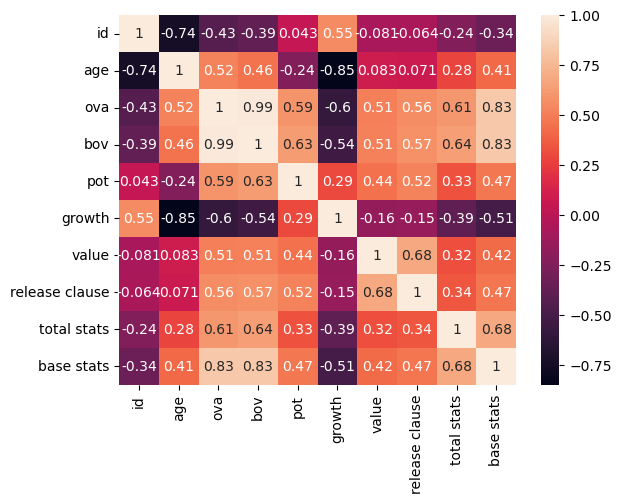

In [39]:
sns.heatmap(data2.corr(),annot=True)
plt.show()

In [40]:
data2 = data2.drop(['bov'],axis=1)

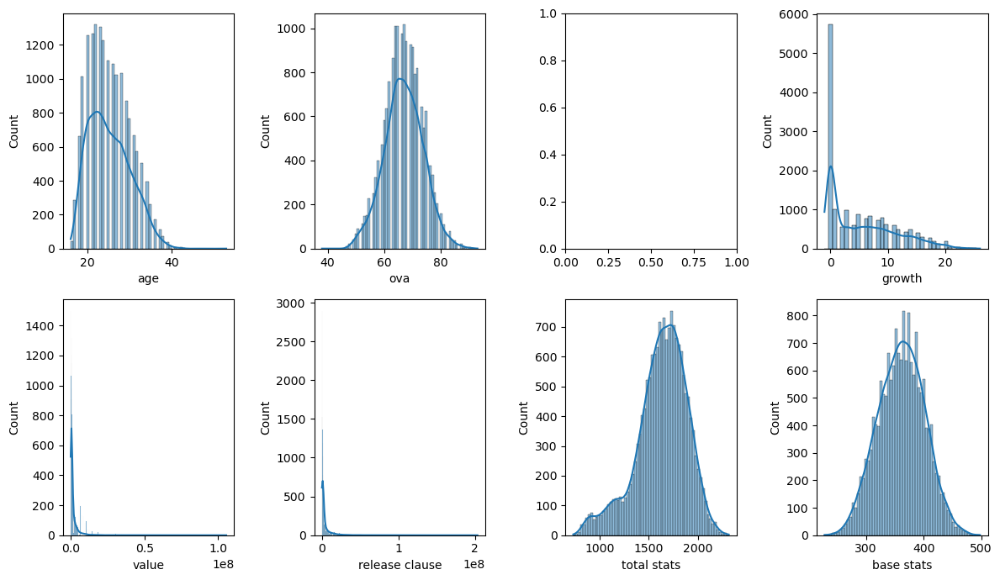

In [41]:
fig, axis = plt.subplots(2,4, figsize=(12,7))

sns.histplot(data2['age'].values, kde=True, ax = axis[0,0]).set_xlabel('age')

sns.histplot(data2['ova'].values, kde=True, ax = axis[0,1]).set_xlabel('ova')

sns.histplot(data2['growth'].values, kde=True, ax = axis[0,3]).set_xlabel('growth')

sns.histplot(data2['value'].values, kde=True, ax = axis[1,0]).set_xlabel('value')

sns.histplot(data2['release clause'].values, kde=True, ax = axis[1,1]).set_xlabel('release clause')

sns.histplot(data2['total stats'].values, kde=True, ax = axis[1,2]).set_xlabel('total stats')

sns.histplot(data2['base stats'].values, kde=True, ax = axis[1,3]).set_xlabel('base stats')

plt.tight_layout()

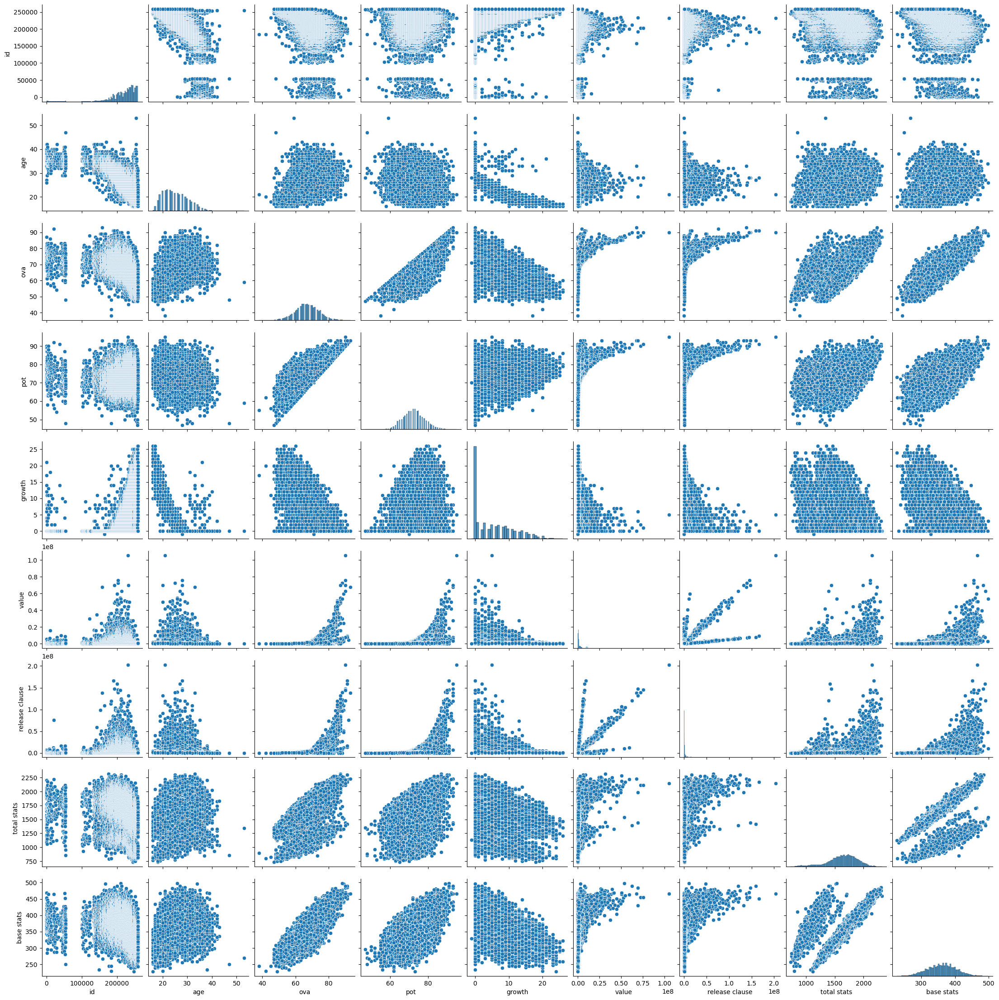

In [42]:
sns.pairplot(data2)
plt.show()

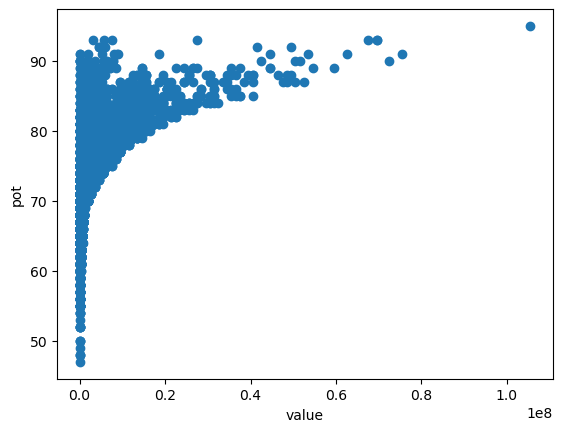

In [43]:
plt.scatter(x=data2['value'], y=data['pot'])
plt.xlabel('value')
plt.ylabel('pot')
plt.show()

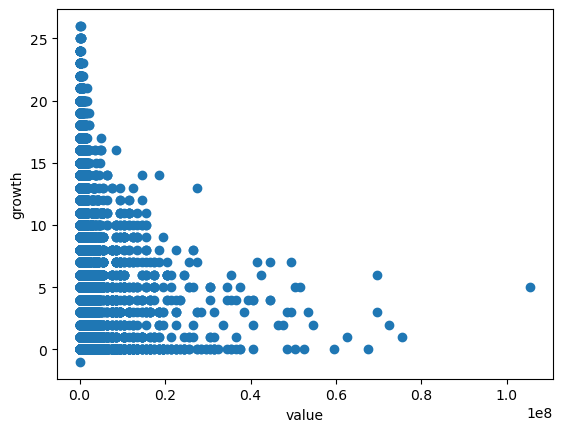

In [44]:
plt.scatter(x=data2['value'], y=data['growth'])
plt.xlabel('value')
plt.ylabel('growth')
plt.show()

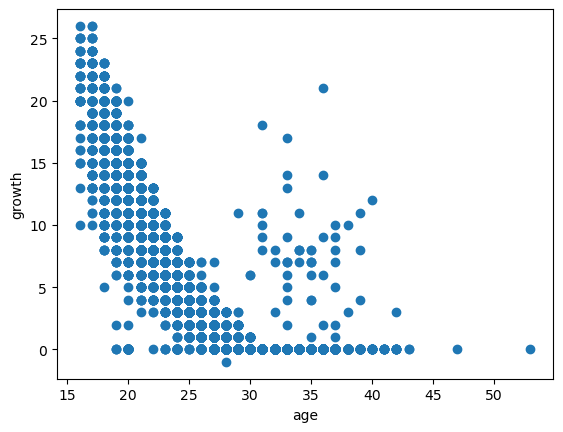

In [45]:
plt.scatter(x=data2['age'], y=data['growth'])
plt.xlabel('age')
plt.ylabel('growth')
plt.show()

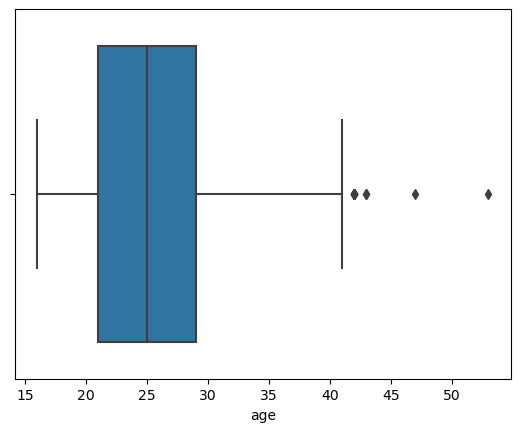

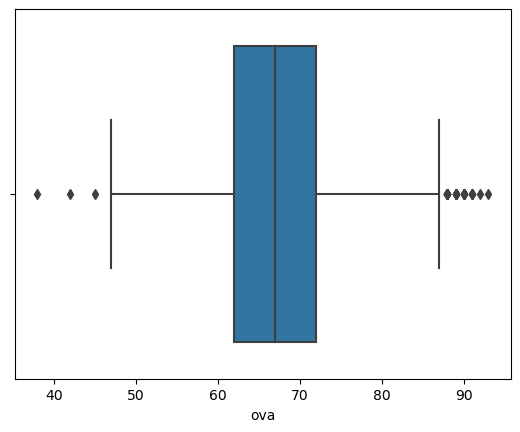

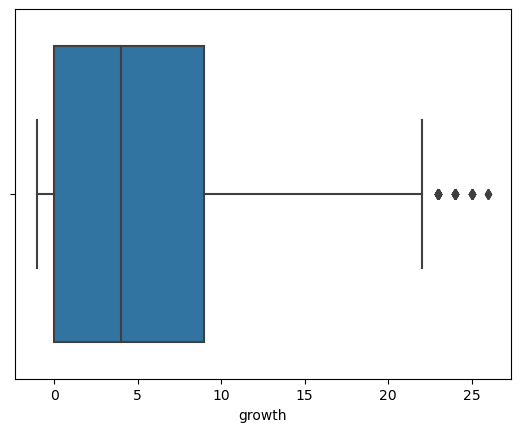

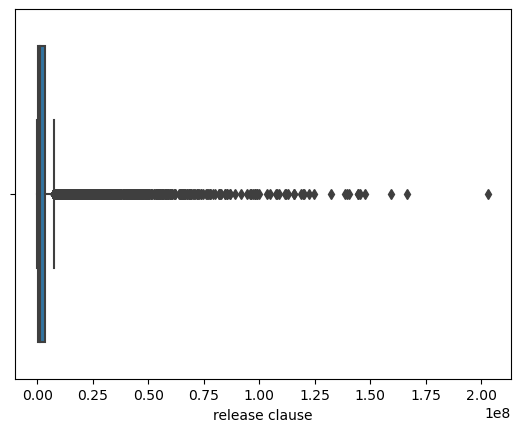

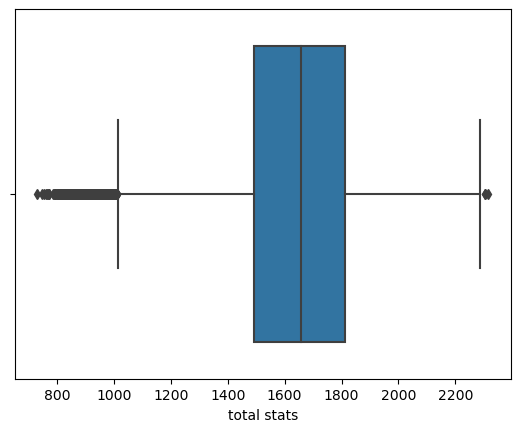

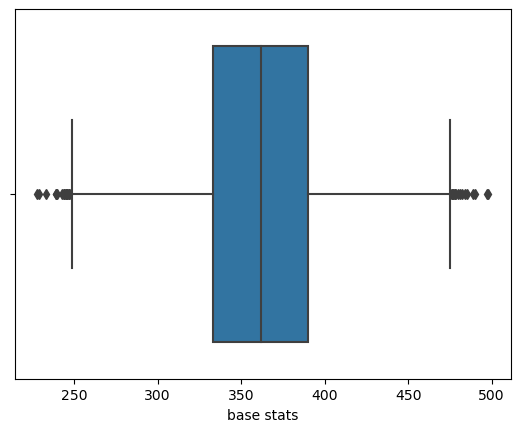

In [46]:
sns.boxplot(x=data2['age'])
plt.show()
sns.boxplot(x=data2['ova'])
plt.show()
sns.boxplot(x=data2['growth'])
plt.show()
sns.boxplot(x=data2['release clause'])
plt.show()
sns.boxplot(x=data2['total stats'])
plt.show()
sns.boxplot(x=data2['base stats'])
plt.show()

In [47]:
len(data2[data2['value'] <= 0])/ len(data2) *100

2.668613138686131

In [48]:
data2.drop(data2[data2['value'] == 0].index, inplace=True)

In [49]:
data2 = data2.reset_index()
data2

,index,id,age,ova,pot,growth,value,release clause,total stats,base stats
0,0,2,33,69,69,0,625000,0,1929,408
1,1,16,37,71,71,0,600000,1100000,1906,385
2,2,27,33,71,71,0,1100000,0,1770,354
3,4,41,36,81,81,0,5500000,7200000,2014,420
4,5,61,27,66,70,4,725000,0,1649,360
...,...,...,...,...,...,...,...,...,...,...
16663,17120,259088,22,64,69,5,550000,0,1367,302
16664,17121,259090,18,56,66,10,130000,273000,1529,319
16665,17122,259091,18,56,67,11,130000,273000,1430,303
16666,17123,259101,20,62,73,11,475000,784000,1579,335


In [50]:
data2.drop(['index'],axis=1, inplace=True)

In [51]:
data2.drop(data2[data2['release clause'] == 0].index, inplace=True)

In [52]:
data2 = data2.reset_index()
data2

,index,id,age,ova,pot,growth,value,release clause,total stats,base stats
0,1,16,37,71,71,0,600000,1100000,1906,385
1,3,41,36,81,81,0,5500000,7200000,2014,420
2,5,80,38,77,77,0,2800000,5300000,2017,403
3,13,1179,42,82,82,0,2200000,3600000,1292,429
4,19,2147,37,72,72,0,325000,455000,1150,388
...,...,...,...,...,...,...,...,...,...,...
15335,16662,259085,19,60,72,12,300000,570000,1023,329
15336,16664,259090,18,56,66,10,130000,273000,1529,319
15337,16665,259091,18,56,67,11,130000,273000,1430,303
15338,16666,259101,20,62,73,11,475000,784000,1579,335


In [53]:
data2.drop(['index'],axis=1, inplace=True)
data2

,id,age,ova,pot,growth,value,release clause,total stats,base stats
0,16,37,71,71,0,600000,1100000,1906,385
1,41,36,81,81,0,5500000,7200000,2014,420
2,80,38,77,77,0,2800000,5300000,2017,403
3,1179,42,82,82,0,2200000,3600000,1292,429
4,2147,37,72,72,0,325000,455000,1150,388
...,...,...,...,...,...,...,...,...,...
15335,259085,19,60,72,12,300000,570000,1023,329
15336,259090,18,56,66,10,130000,273000,1529,319
15337,259091,18,56,67,11,130000,273000,1430,303
15338,259101,20,62,73,11,475000,784000,1579,335


In [54]:
data2.drop(['growth'],axis=1, inplace=True)

In [55]:
data2.to_csv('data2_final_data.csv')

In [56]:
data2

,id,age,ova,pot,value,release clause,total stats,base stats
0,16,37,71,71,600000,1100000,1906,385
1,41,36,81,81,5500000,7200000,2014,420
2,80,38,77,77,2800000,5300000,2017,403
3,1179,42,82,82,2200000,3600000,1292,429
4,2147,37,72,72,325000,455000,1150,388
...,...,...,...,...,...,...,...,...
15335,259085,19,60,72,300000,570000,1023,329
15336,259090,18,56,66,130000,273000,1529,319
15337,259091,18,56,67,130000,273000,1430,303
15338,259101,20,62,73,475000,784000,1579,335


In [57]:
stats.boxcox(data2['age'])

(array([2.6925279 , 2.67773591, 2.70685885, ..., 2.27945953, 2.34308916,
        2.27945953]),
 -0.17136030638307675)

In [58]:
arr, lmbda = stats.boxcox(data2['age']) 
data2['age'] = arr

In [59]:
arr, lmbda = stats.boxcox(data2['ova']) 
data2['ova'] = arr

In [60]:
arr, lmbda = stats.boxcox(data2['value']) 
data2['value'] = arr

In [61]:
arr, lmbda = stats.boxcox(data2['release clause']) 
data2['release clause'] = arr

In [62]:
arr, lmbda = stats.boxcox(data2['total stats']) 
data2['total stats'] = arr

In [63]:
arr, lmbda = stats.boxcox(data2['base stats']) 
data2['base stats'] = arr

In [64]:
final_data = MinMaxScaler().fit(data2).transform(data2)

In [65]:
final_data

array([[0.00000000e+00, 7.93655411e-01, 5.29027882e-01, ...,
        6.27375082e-01, 6.11503707e-01, 5.75149418e-01],
       [9.64919391e-05, 7.69478341e-01, 7.44489530e-01, ...,
        7.82470652e-01, 7.04379275e-01, 7.05915910e-01],
       [2.47019364e-04, 8.17078919e-01, 6.58601864e-01, ...,
        7.58969113e-01, 7.07054342e-01, 6.42301841e-01],
       ...,
       [9.99945965e-01, 1.18507532e-01, 2.00654366e-01, ...,
        4.93753064e-01, 2.79147450e-01, 2.72155928e-01],
       [9.99984561e-01, 2.22508255e-01, 3.32828717e-01, ...,
        5.96459000e-01, 3.70026230e-01, 3.89792430e-01],
       [1.00000000e+00, 1.18507532e-01, 2.66888874e-01, ...,
        5.96930735e-01, 2.62809478e-01, 2.42878398e-01]])

In [66]:
final_data=pd.DataFrame(MinMaxScaler().fit(data2).transform(data2))
final_data

,0,1,2,3,4,5,6,7
0,0.000000,0.793655,0.529028,0.500000,0.614861,0.627375,0.611504,0.575149
1,0.000096,0.769478,0.744490,0.708333,0.800683,0.782471,0.704379,0.705916
2,0.000247,0.817079,0.658602,0.625000,0.747702,0.758969,0.707054,0.642302
3,0.004489,0.904037,0.765903,0.729167,0.728031,0.728340,0.205256,0.739667
4,0.008225,0.793655,0.550688,0.520833,0.556982,0.544729,0.139222,0.586327
...,...,...,...,...,...,...,...,...
15335,0.999923,0.172111,0.288901,0.520833,0.549201,0.566466,0.088473,0.367674
15336,0.999942,0.118508,0.200654,0.395833,0.464687,0.493753,0.338224,0.330871
15337,0.999946,0.118508,0.200654,0.416667,0.464687,0.493753,0.279147,0.272156
15338,0.999985,0.222508,0.332829,0.541667,0.593160,0.596459,0.370026,0.389792


In [67]:
final_data.columns = data2.columns
final_data

,id,age,ova,pot,value,release clause,total stats,base stats
0,0.000000,0.793655,0.529028,0.500000,0.614861,0.627375,0.611504,0.575149
1,0.000096,0.769478,0.744490,0.708333,0.800683,0.782471,0.704379,0.705916
2,0.000247,0.817079,0.658602,0.625000,0.747702,0.758969,0.707054,0.642302
3,0.004489,0.904037,0.765903,0.729167,0.728031,0.728340,0.205256,0.739667
4,0.008225,0.793655,0.550688,0.520833,0.556982,0.544729,0.139222,0.586327
...,...,...,...,...,...,...,...,...
15335,0.999923,0.172111,0.288901,0.520833,0.549201,0.566466,0.088473,0.367674
15336,0.999942,0.118508,0.200654,0.395833,0.464687,0.493753,0.338224,0.330871
15337,0.999946,0.118508,0.200654,0.416667,0.464687,0.493753,0.279147,0.272156
15338,0.999985,0.222508,0.332829,0.541667,0.593160,0.596459,0.370026,0.389792


In [68]:
X=final_data.drop(['pot'],axis=1)
Y=final_data['pot']

In [69]:
X = sm.add_constant(X)
X.head()

,const,id,age,ova,value,release clause,total stats,base stats
0,1.0,0.000000,0.793655,0.529028,0.614861,0.627375,0.611504,0.575149
1,1.0,0.000096,0.769478,0.744490,0.800683,0.782471,0.704379,0.705916
2,1.0,0.000247,0.817079,0.658602,0.747702,0.758969,0.707054,0.642302
3,1.0,0.004489,0.904037,0.765903,0.728031,0.728340,0.205256,0.739667
4,1.0,0.008225,0.793655,0.550688,0.556982,0.544729,0.139222,0.586327


In [70]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.40,random_state=150)

In [71]:
model = sm.OLS(Y_train,X_train).fit()

In [72]:
predictions = model.predict(X_test)

In [73]:
r2_score(Y_test,predictions)

0.8481164149442258

In [74]:
data2

,id,age,ova,pot,value,release clause,total stats,base stats
0,16,2.692528,52.463318,71,7.985090,7.853824,1.515539e+07,543.951540
1,41,2.677736,59.305248,81,8.640625,8.334794,1.720306e+07,597.100235
2,80,2.706859,56.577907,77,8.453720,8.261913,1.726204e+07,571.244951
3,1179,2.760061,59.985218,82,8.384325,8.166929,6.198645e+06,610.818060
4,2147,2.692528,53.151134,72,7.780907,7.597528,4.742753e+06,548.494381
...,...,...,...,...,...,...,...,...
15335,259085,2.312255,44.838141,72,7.753460,7.664939,3.623866e+06,459.625109
15336,259090,2.279460,42.035899,66,7.455313,7.439447,9.130260e+06,444.667251
15337,259091,2.279460,42.035899,67,7.455313,7.439447,7.827760e+06,420.802954
15338,259101,2.343089,46.233062,73,7.908535,7.757950,9.831411e+06,468.615100


In [75]:
cleandata= pd.read_csv('data2_final_data.csv')
cleandata.drop(['Unnamed: 0'],axis=1, inplace=True)
cleandata

,id,age,ova,pot,value,release clause,total stats,base stats
0,16,37,71,71,600000,1100000,1906,385
1,41,36,81,81,5500000,7200000,2014,420
2,80,38,77,77,2800000,5300000,2017,403
3,1179,42,82,82,2200000,3600000,1292,429
4,2147,37,72,72,325000,455000,1150,388
...,...,...,...,...,...,...,...,...
15335,259085,19,60,72,300000,570000,1023,329
15336,259090,18,56,66,130000,273000,1529,319
15337,259091,18,56,67,130000,273000,1430,303
15338,259101,20,62,73,475000,784000,1579,335


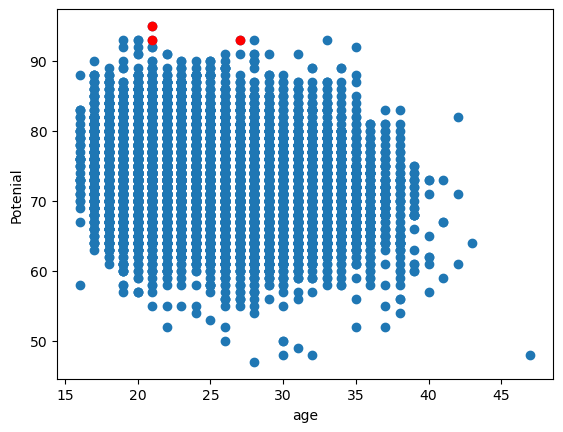

In [76]:
plt.scatter(x=cleandata['age'], y=cleandata['pot'])
plt.style.use('default')
plt.scatter(21,95, c='r')
plt.scatter(21,93, c='r')
plt.scatter(27,93, c='r')
plt.xlabel('age')
plt.ylabel('Potenial')
plt.show()

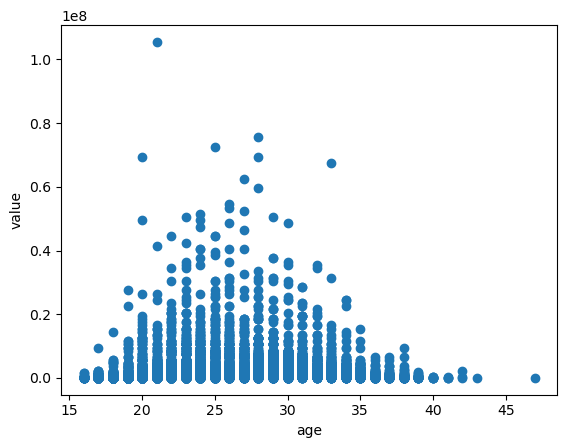

In [77]:
plt.scatter(x=cleandata['age'], y=cleandata['value'])
plt.xlabel('age')
plt.ylabel('value')
plt.show()

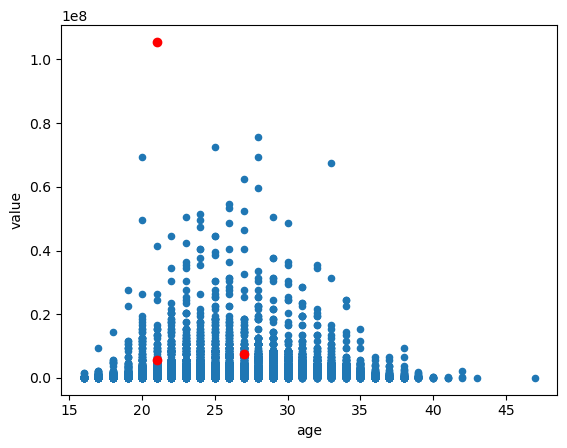

In [78]:
plt.scatter(x=cleandata['age'], y=cleandata['value'], s=20)
plt.scatter(21,105500000, c='r')
plt.scatter(21,5700000, c='r')
plt.scatter(27,7500000, c='r')
plt.xlabel('age')
plt.ylabel('value')
plt.show()

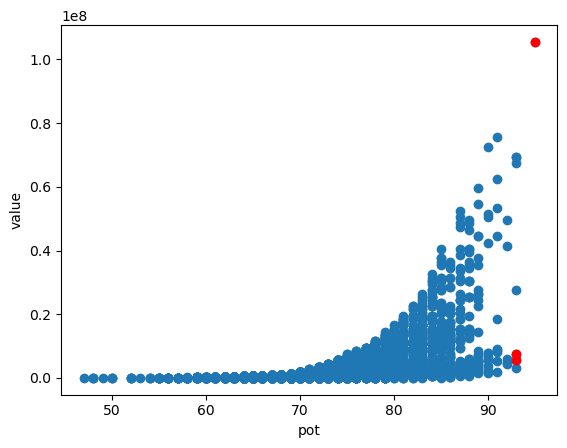

In [79]:
plt.scatter(x=cleandata['pot'], y=cleandata['value'])
plt.scatter(95,105500000, c='r')
plt.scatter(93,5700000, c='r')
plt.scatter(93,7500000, c='r')
plt.xlabel('pot')
plt.ylabel('value')
plt.show()

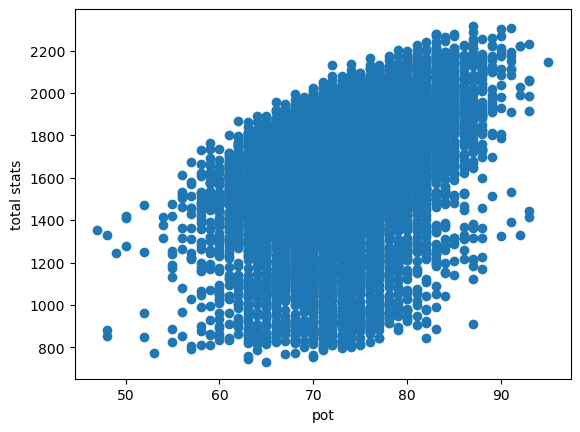

In [80]:
plt.scatter(x=cleandata['pot'], y=cleandata['total stats'])
plt.xlabel('pot')
plt.ylabel('total stats')
plt.show()

In [81]:
cleandata.sort_values(by=['pot','age','value'], inplace=False,
               ascending = [True, True, True])

,id,age,ova,pot,value,release clause,total stats,base stats
14940,257936,28,47,47,30000,47000,1352,296
1413,183749,30,48,48,20000,35000,883,269
14867,257680,32,48,48,20000,31000,1329,284
100,53985,47,48,48,3000,5000,852,250
14292,255618,31,49,49,25000,39000,1246,267
...,...,...,...,...,...,...,...,...
9147,235790,21,85,93,5700000,119700000,2058,441
3070,200389,27,91,93,7500000,159400000,1413,489
2257,192448,28,90,93,69500000,147700000,1442,484
435,158023,33,93,93,67500000,138400000,2231,466


In [82]:
resultado = data.loc[data['id'].isin([231747, 158023, 192448, 200389, 235790])]
resultado

,id,name,age,ova,nationality,club,bov,bp,position,pot,height,weight,foot,growth,joined,loan date end,value,wage,release clause,contract,attacking,crossing,finishing,heading accuracy,short passing,volleys,skill,dribbling,curve,fk accuracy,long passing,ball control,movement,acceleration,sprint speed,agility,reactions,balance,power,shot power,jumping,stamina,strength,long shots,mentality,aggression,interceptions,positioning,vision,penalties,composure,defending,marking,standing tackle,sliding tackle,goalkeeping,gk diving,gk handling,gk kicking,gk positioning,gk reflexes,total stats,base stats,w/f,sm,a/w,d/w,ir,pac,sho,pas,dri,def,phy,hits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
752,158023,L. Messi,33,93,Argentina,FC Barcelona,93,RW,RW ST CF,93,"5'7""",159lbs,Left,0,"Jul 1, 2004",NaN,€67.5M,€560K,€138.4M,2004 ~ 2021,429,85,95,70,91,88.0,470,96,93.0,94,91,96,451,91,80,91.0,94,95.0,389,86,68.0,72,69,94,347,44,40.0,93.0,95.0,75,96.0,91,32,35,24.0,54,6,11,15,14,8,2231,466,4 ★,4★,Medium,Low,5 ★,85,92,91,95,38,65,830,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3,19+3
2790,192448,M. ter Stegen,28,90,Germany,FC Barcelona,90,GK,GK,93,"6'2""",187lbs,Right,3,"Jul 1, 2014",NaN,€69.5M,€260K,€147.7M,2014 ~ 2022,118,18,14,11,61,14.0,144,21,18.0,12,63,30,254,38,50,37.0,86,43.0,268,66,79.0,35,78,10,171,43,22.0,11.0,70.0,25,70.0,48,25,13,10.0,439,88,85,88,88,90,1442,484,4 ★,1★,Medium,Medium,3 ★,88,85,88,90,45,88,213,35+3,35+3,35+3,34+0,38+0,38+0,38+0,34+0,42+3,42+3,42+3,39+3,45+3,45+3,45+3,39+3,33+3,41+3,41+3,41+3,33+3,31+3,33+3,33+3,33+3,31+3,88+3
3665,200389,J. Oblak,27,91,Slovenia,Atlético Madrid,91,GK,GK,93,"6'2""",192lbs,Right,2,"Jul 16, 2014",NaN,€75M,€125K,€159.4M,2014 ~ 2023,95,13,11,15,43,13.0,109,12,13.0,14,40,30,307,43,60,67.0,88,49.0,268,59,78.0,41,78,12,140,34,19.0,11.0,65.0,11,68.0,57,27,12,18.0,437,87,92,78,90,90,1413,489,3 ★,1★,Medium,Medium,3 ★,87,92,78,90,52,90,220,33+3,33+3,33+3,32+0,35+0,35+0,35+0,32+0,38+3,38+3,38+3,35+3,38+3,38+3,38+3,35+3,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3,89+3
9331,231747,K. Mbappé,21,90,France,Paris Saint-Germain,91,ST,ST LW RW,95,"5'10""",161lbs,Right,5,"Jul 1, 2018",NaN,€105.5M,€160K,€203.1M,2018 ~ 2022,408,78,91,73,83,83.0,394,92,79.0,63,70,90,458,96,96,92.0,92,82.0,404,86,77.0,86,76,79,341,62,38.0,91.0,80.0,70,84.0,100,34,34,32.0,42,13,5,7,11,6,2147,466,4 ★,5★,High,Low,3 ★,96,86,78,91,39,76,1.2K,88+3,88+3,88+3,89+0,89+0,89+0,89+0,89+0,87+3,87+3,87+3,87+3,79+3,79+3,79+3,87+3,67+3,63+3,63+3,63+3,67+3,63+3,55+3,55+3,55+3,63+3,18+3
10354,235790,K. Havertz,21,85,Germany,Chelsea,87,CAM,CAM RM CF,93,"6'2""",183lbs,Left,8,"Sep 4, 2020",NaN,€57M,€105K,€119.7M,2020 ~ 2025,400,73,85,78,84,80.0,388,86,84.0,53,78,87,403,78,88,78.0,85,74.0,378,74,75.0,82,69,78,319,42,38.0,84.0,82.0,73,84.0,123,39,46,38.0,47,6,8,11,10,12,2058,441,4 ★,4★,Medium,Medium,3 ★,84,81,79,85,45,67,1.3K,82+3,82+3,82+3,83+0,84+0,84+0,84+0,83+0,84+3,84+3,84+3,83+3,79+3,79+3,79+3,83+3,66+3,64+3,64+3,64+3,66+3,63+3,56+3,56+3,56+3,63+3,17+3


In [83]:
import plotly.express as px
import plotly.graph_objects as pgo

In [84]:
px.scatter(x=cleandata['pot'], y=cleandata['total stats'])

In [85]:
px.scatter(cleandata, x="age", y="value")

#px.scatter(21,5700000, c='r')
#px.scatter(27,7500000, c='r')
#px.xlabel('age')
#px.ylabel('value')


In [86]:
fig = px.scatter(cleandata, x="age", y="value", color='value')
fig.show()

In [87]:
fig = px.scatter(cleandata, x="pot", y="value", color='value')
fig.show()

In [92]:
fig = px.scatter(cleandata, x="age", y="pot")
fig.show()